# Trajectory analysis

In this notebook, we will explore the problem of trajectory analysis

# Load packages

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import seaborn as sns

# Load processed data

We will continue with the data used in session-2:

In [2]:
input_path = '/Users/sara.jimenez/Documents/scWorkshop/data/'

In [3]:
adata_clean = sc.read_h5ad(input_path + 'processed/annotated_data.h5ad')

In [4]:
adata_clean

AnnData object with n_obs × n_vars = 11828 × 17698
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_pct_content', 'ribo_pct_content', 'doublet_score', 'doublet', 'G2_M_checkpoint', 'leiden_r1.5', 'leiden_r0.5', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_r0.5_colors', 'leiden_r1.5_colors', 'log1p', 'neighbors_30', 'on_norm_log', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_data'
    obsp: 'neighbors_30_connectivities', 'neighbors_30_distances'

# Trajectory Inference

scRNA-seq has been applied extensively to study developmental systems. It is now generally understood that the process of differentiation is a continuous process rather than a series of discreet/distinct stages. Trajectory inference is a computational framework to align the cells developing from one phenotype to another along a continuous axis (also called pseudotime).

Underlying pseudotime analysis is the assumption that because differentiation process is asynchronous, a single snapshot of scRNA-seq data comprises of cells in all possible states during the process. This allows us to utilize the heterogeneity among the cells to align them along a continuous axis. In essence, we are interested in capturing gradual changes during the process, which means we ought to understand and map local similarity between cells. As we have discussed extensively in sessions 2 and 3, graphs are the perfect mathematical tools to do so. Therefore, all the methods we discuss below will rely on modeling the data using a graph.

There are tens of algorithms developed to perform pseudotime analysis on single-cell RNA-seq data. Here, we will discuss two important methods, namely diffusion maps and Palantir, for their effectiveness and success we have seen in scRNA-seq data analysis. ( Note: Palantir develops on top of diffusion maps).

Refs: 

https://www.nature.com/articles/s41587-019-0071-9?platform=hootsuite

https://pubmed.ncbi.nlm.nih.gov/30899105/

https://www.nature.com/articles/nmeth.3971

## Diffusion Maps

Diffusion Maps are a suite of graph-based techniques to perform non-linear dimensionality reduction of high-dimensional data. They can be crudely thought of as non-linear version of PCA: just like PCA, diffusion maps will identify axis of high variances in the data, but unlike PCA - which is linear - diffusion maps take into consideration  non-linear associations between features (genes in our case) of the data. In other words, diffusion maps transform any high-dimensional data into a lower dimensional Euclidean space by accounting for any non-linear dependencies between the features. In doing so, it preserves the relationship between points that are similar in high-dimensional space and discards distant relationships. 

This property of diffusion maps makes it very favorable for single-cell data analysis. By preserving the local neighborhood structure, it provides a platform to incrementally navigate along the data manifold. Unlike diffusion maps, UMAP (and Force Directed Layout) - while useful to visualize data - does not accurately preserve high-dimensional pairwise distances in the resulting low-dimensional representation. This limits the use of UMAP (and Force Directed Layout) to visualization and does not facilitate any further quantitative analysis. However, since diffusion maps are distance preserving, they can be used for downstream analysis.

The need for using diffusion maps also stems from our assumption that scRNA-seq data are inherently noisy and biological signals are masked by the noise. As such, we typically begin by performing principal component analysis as a way to decouple strong variability in the data (true biological signal) from random noise. As we discussed in our previous workshop, this is achieved by retrieving only the top `p` principal components and neglecting the rest (which typically identify with noise in the data) for any downstream analysis. However, we have observed with scRNA-seq data that PCA is generally ideal for working with global aspects of the data (such as to cluster the cells on, visualize the data etc.) but is not _always_ optimal for a finer analysis such as pseudotime alignment of individual cells. 

One of the popular ways to study cells along a continuum of gene expression space (as opposed to distinct clusters) is to apply diffusion maps on the retrieved principal components. Because the resulting embedding aims to preserve the local neighborhood of each cell, the diffusion maps form a natural coordinate system for cells along a continuum. As a result, they have been most successfully employed to align cells undergoing development along a trajectory. The success of diffusion maps relies on its ability to capture the geometry of the data accurately. 

Diffusion maps work by first building a k-nearest neighbor graph on the principal components (similar to clustering analysis, see session 1 or previous workshop material), followed by conversion of the distance graph to an affinity graph. While there are various models/methods proposed to convert distance matrix to affinity matrix, we recommend using adaptive Gaussian kernel. The kernel ensures that affinity between cells decrease exponentially with distance between cells in every direction (of expression or PCA space) but remains sensitive to density of cells near every cell. In other words, if the neighborhood of a cell is densely sampled then the similarity between cells is more concentrated while if the neighborhood of a cell is sparsely sampled then the similarity is more diffuse. This is important to avoid bias in analysis due to sampling differences in a heterogeneous population of cells. The affinity matrix is then converted into a Markov matrix, which represents a probabilistic framework of cellular state neighborhood. To elaborate, for a data of K cells, the Markov matrix is of size K-by-K; each row of the matrix sums to 1 and the (i, j)-th entry of the matrix represents the probability of a cell transitioning from state i to state j in one time step. Therefore, the Markov matrix automatically provides a probabilistic representation of cellular transition and is well-suited for pseudotime analysis that aims to align the cells along their differentiation transition states. Furthermore, because we begin with the k-nearest neighbor graph, only the immediate neighborhood each cell (i.e. phenotypically most similar cells) get high probability score of transition. Once the Markov matrix is constructed, we obtain the eigenvalues and eigenvectors of the matrix (analogous to the procedure in PCA) and order the eigenvectors based on the associated eigenvalue. We interpret the top eigenvector (we ignore the first eigenvector with eigenvalue of 1, see references below for this) as the direction of highest variability in the data, and often can be used to study cellular transitions in the data. These eigenvectors are called the diffusion components or diffusion maps (maps because they map the data from high-dimensional gene expression or PCA space to a lower dimensional diffusion space). Similarly, we encourage you to explore the next few eigenvectors to study any potential axes of continuum in the data. We will discuss more below. 


You will notice that this is very similar to how we performed MAGIC above, and indeed the construction of Markov Matrix is identical and it is used for two separate scenarios.

Refs: 
https://www.nature.com/articles/nmeth.3971

https://www.nature.com/articles/nbt.3569

https://www.sciencedirect.com/science/article/pii/S1063520306000546

The size of the nearest neighborhood (`k` or `n_neighbors` parameter) is a crucial parameter and analogous to clustering analysis, we recommend you to choose it such that it is small enough to only consider local neighbors of each cell, but large enough that you do not get discrete sub-graphs. A typical choice of `n_neighbors` is `30`. Furthermore, analogous to clustering analysis, it is highly recommended that you show your results do not vary with slight alterations in the value of `n_neighbors`. For example, if you wish to choose `n_neighbors = 30` then we recommend that you recompute the graph for various values of `n_neighbors` around `30` such as `n_neighbors = (21, 24, 27, 30, 33, 36, 39)` and show that the meaningful diffusion components you obtain for all these values of `n_neighbors` are highly correlated to each other. 

### Method 1: Scanpy inbuilt diffusion maps

In [5]:
adata_clean

AnnData object with n_obs × n_vars = 11828 × 17698
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_pct_content', 'ribo_pct_content', 'doublet_score', 'doublet', 'G2_M_checkpoint', 'leiden_r1.5', 'leiden_r0.5', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_r0.5_colors', 'leiden_r1.5_colors', 'log1p', 'neighbors_30', 'on_norm_log', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_data'
    obsp: 'neighbors_30_connectivities', 'neighbors_30_distances'

In [6]:
# n_comps is the number of top eigenvalues/eigenvectors you would like to compute, 20-30 is usually sufficient
sc.tl.diffmap(adata_clean, n_comps=20, neighbors_key = 'neighbors_30')

In [7]:
adata_clean

AnnData object with n_obs × n_vars = 11828 × 17698
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_pct_content', 'ribo_pct_content', 'doublet_score', 'doublet', 'G2_M_checkpoint', 'leiden_r1.5', 'leiden_r0.5', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_r0.5_colors', 'leiden_r1.5_colors', 'log1p', 'neighbors_30', 'on_norm_log', 'pca', 'rank_genes_groups', 'umap', 'diffmap_evals'
    obsm: 'X_pca', 'X_umap', 'X_diffmap'
    varm: 'PCs'
    layers: 'raw_data'
    obsp: 'neighbors_30_connectivities', 'neighbors_30_distances'

We can view the eigenvalues as below. The first eigenvalue is exactly 1 and this expected due to a property of any Markov matrix (any matrix whose rows sum to 1). This only reflects that there is one big connected component in the data (which is a common property across any data by construction and not specific to the current data) and we ignore this eigenvalue and the corresponding eigenvector. Note: if you see multiple eigenvalues exactly equal to 1, which is rare in scRNA-seq data specifically in the context of development, then that has a different, and important, interpretation. Please see the references above.

We interpret the next eigenvalue and the associated eigenvector as the most informative component about the data that indicates direction of most biological variability. Often this indicates towards a possible transition between cell states.

Text(0, 0.5, 'Eigen-Values')

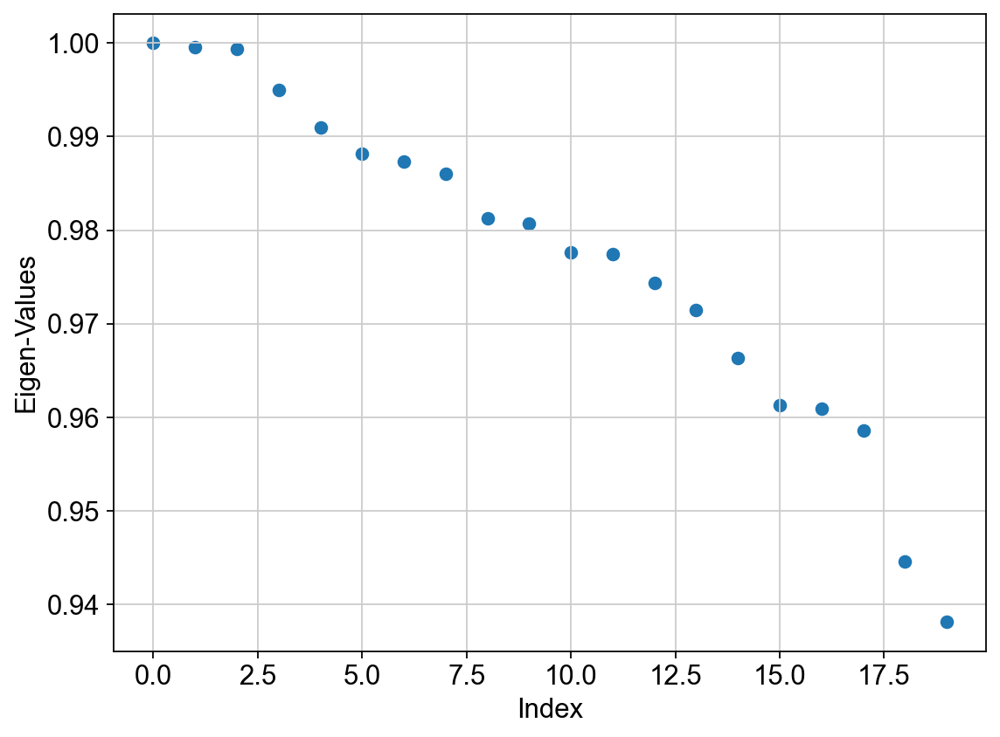

In [8]:
sc.set_figure_params(scanpy=True, fontsize = 14, figsize = (8, 6))
plt.scatter(range(len(adata_clean.uns['diffmap_evals'])), adata_clean.uns['diffmap_evals'])
plt.grid('on')
plt.xlabel('Index')
plt.ylabel('Eigen-Values')

We also use the first large gap in the eigenvalue spectrum (i.e. the plot above) to quantify the number of most meaningful diffusion components to consider for analysis. For example, in the plot above, we see a substantial gap between 6th and 7th eigenvalue. This indicates that perhaps the first 6 eigenvalues and associated eigenvectors are the most meaningful. This may seem a bit arbitrary (especially when you see that there is a much bigger change between 17th and 18th eigenvector), and we will discuss how to avoid this pitfall in the next session (see Palantir).

We visualize the top 10 eigenvectors as follows (Note: we must ignore the first i.e. 0th eigenvector from downstream analysis):

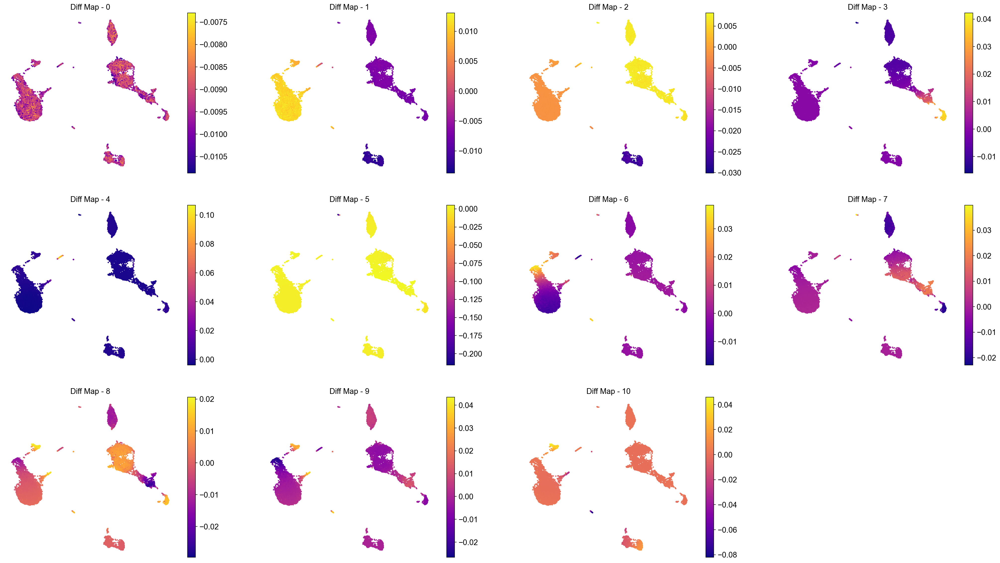

In [9]:
ncol = 4
nrow = 3

fig = plt.figure(figsize = (8*ncol, 6*nrow))
for j in range(11):
    ax = fig.add_subplot(nrow, ncol, j + 1)
    im1 = ax.scatter(adata_clean.obsm['X_umap'][:, 0], adata_clean.obsm['X_umap'][:, 1], s = 2, 
                 c = adata_clean.obsm['X_diffmap'][:, j], cmap = 'plasma')
    fig.colorbar(im1)
    ax.axis('off')
    ax.set_title('Diff Map - ' + str(j))
    
# To save: 
# fig.savefig(output_directory + 'umap_colored_by_diff_maps.png', bbox_inches = 'tight', dpi = 150)

/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


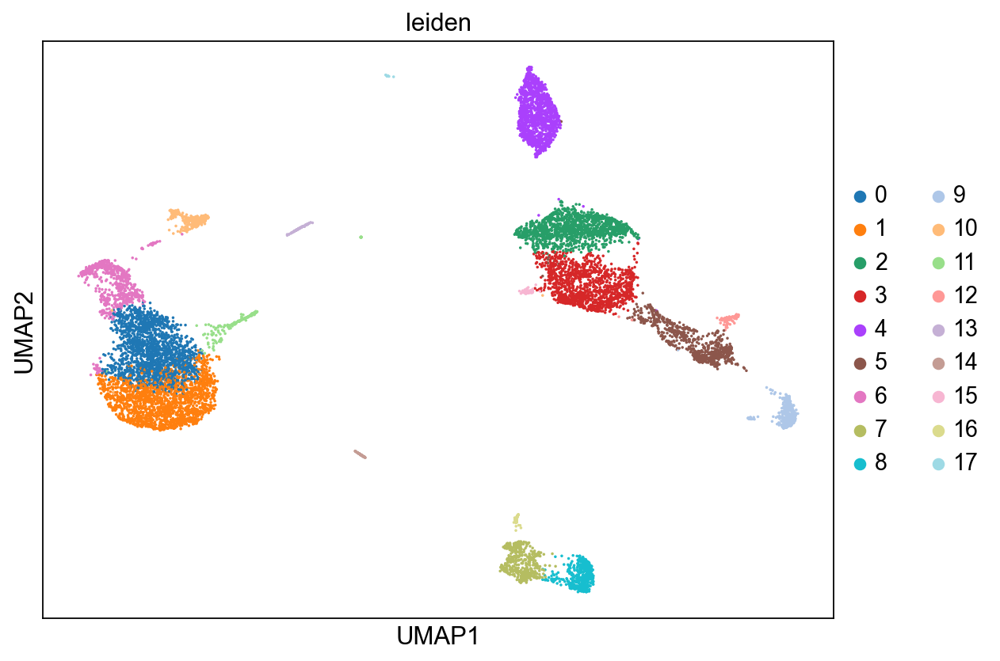

In [10]:
sc.pl.umap(adata_clean, color='leiden')

Interpreting the diffusion maps:
    
1. We ignore the 0th diffusion component (for reasons, please see the text above and the provided references).
2. The next top diffusion component (Diff Map - 1) separates out clusters 6, 0 and 1. 
3. Diff Map - 2 separates out clusters 4, 2, 3, 5, and 9. 
4. Diff Map - 3 identifies the small cluster 9 as being distinct from rest of the data. Note: if C9 is so different and is not clear what kind of cell type it is, diffusion maps could be hinting that it is a rare and distinct or a noisy cluster of cells. As such, diffusion maps can be used for data clean-up as well.

And so forth.

To summarize, diffusion maps attempt to highlight the differences or variablity in the data. However, we set out to illustrate the use of diffusion maps for the context of aligning cells on a continuous axis and as such, applying it to data with clear separated clusters (like the example above) is not ideal. Therefore, we will run diffusion maps on a separate data (provided along with this notebook) and interpret the findings.

### Example data 2: Cells along a continuum

The data is taken from https://www.nature.com/articles/s41587-019-0068-4 and downloaded from https://github.com/dpeerlab/Palantir. The data has already been normalized, clustered, cell type annotated and visualization maps have also been computed.

The data consists of CD34+ human bone marrow cells undergoing differentiation.

In [12]:
adata_bm = sc.read_h5ad(input_path + '/human_cd34_bm_rep1.h5ad')

In [13]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs'

In [14]:
# Change the name of the obsm so we can invoke scanpy plotting functions
adata_bm.obsm['X_tsne'] = adata_bm.obsm['tsne']

/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


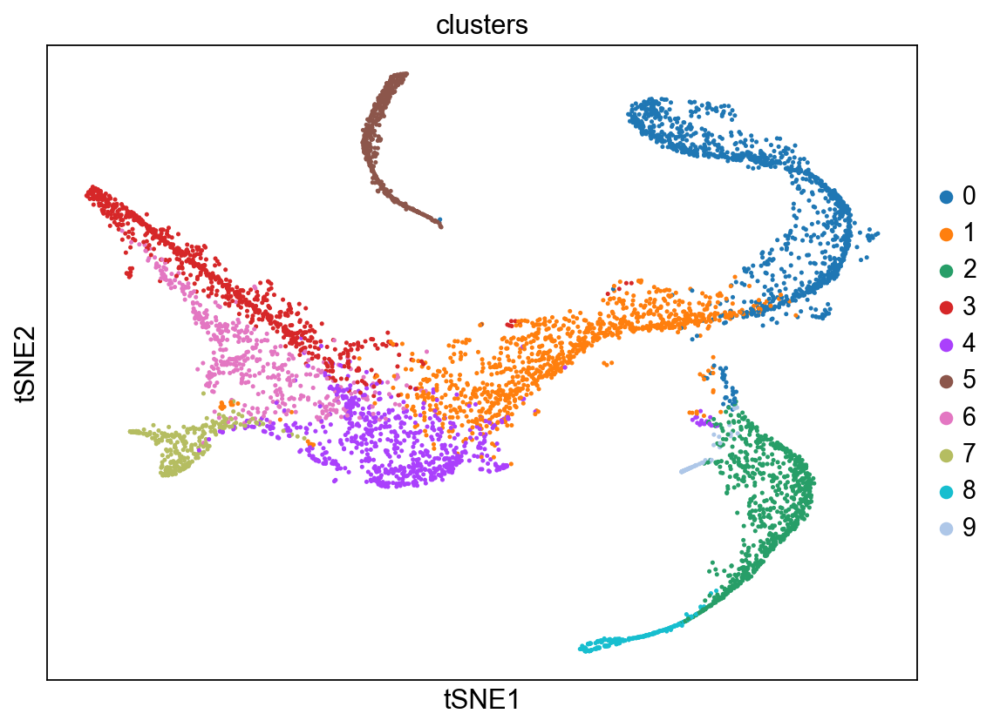

In [15]:
sc.pl.tsne(adata_bm, color = 'clusters')

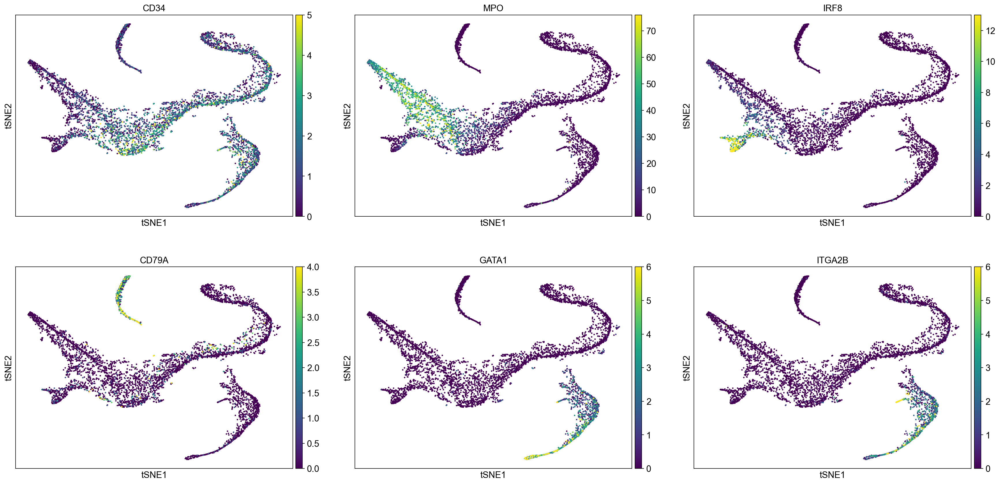

In [16]:
# Visualize some gene expression trends
genes = ['CD34', 'MPO', 'IRF8', 'CD79A', 'GATA1', 'ITGA2B']
sc.pl.tsne(adata_bm, color = genes, ncols = 3, vmin = 'p1', vmax = 'p99')

In [17]:
# We are computing 300 principal components as that is what the authors used. 
# The rationale was that they wanted to consider enough PCs to explain 75% of the variance in the data
sc.tl.pca(adata_bm, n_comps = 300)

In [18]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca'
    varm: 'PCs'

### Nearest neighbor and diffusion maps

In [19]:
# Compute diffusion maps
sc.pp.neighbors(adata_bm, n_neighbors=30, use_rep = 'X_pca', metric='euclidean', key_added='neighbors_30')
sc.tl.diffmap(adata_bm, n_comps=30, neighbors_key = 'neighbors_30')

/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/pyt

Text(0, 0.5, 'Eigen-Values')

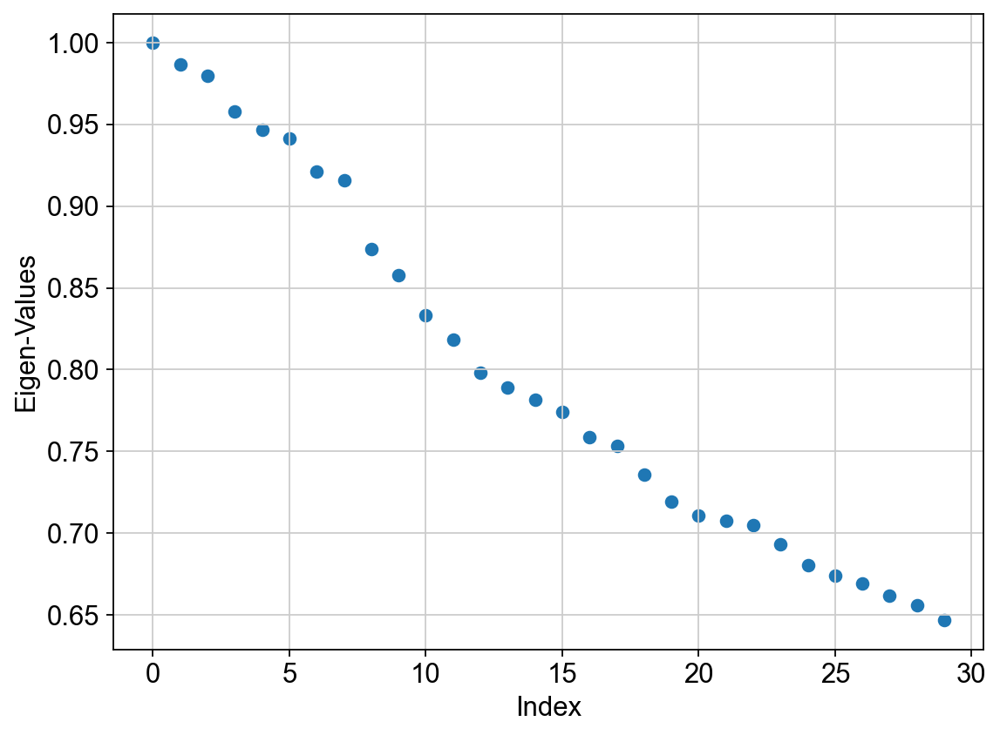

In [20]:
# Eigenvalues
plt.scatter(range(len(adata_bm.uns['diffmap_evals'])), adata_bm.uns['diffmap_evals'])
plt.grid('on')
plt.xlabel('Index')
plt.ylabel('Eigen-Values')

We see a clear gap between 8th and 9th eigenvalues (note: counting starts at 0). This is indicative that the first 8 eigenvalues are the most informative about the data.

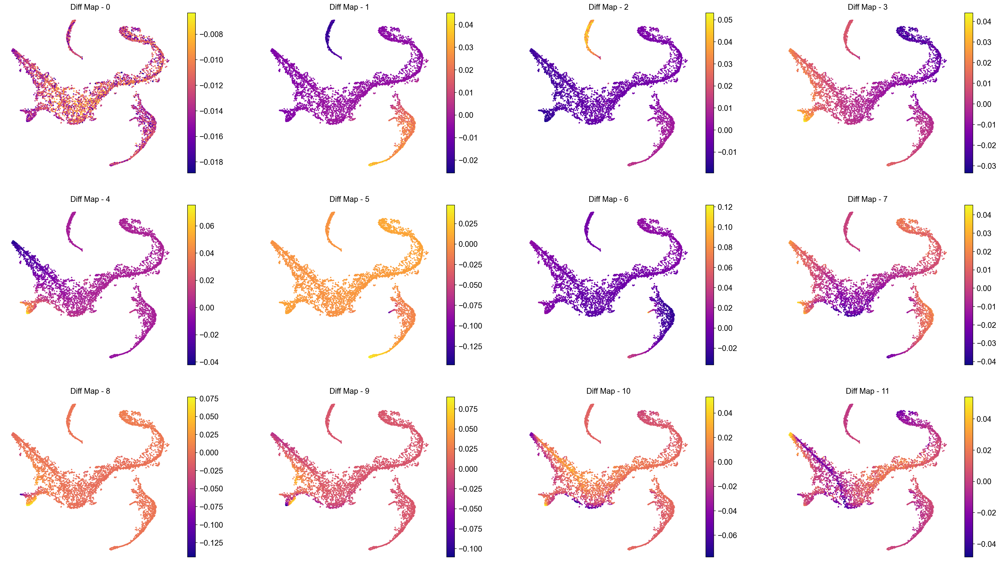

In [21]:
# Visualize the first 12 eigenvectors
ncol = 4
nrow = 3

fig = plt.figure(figsize = (8*ncol, 6*nrow))
for j in range(12):
    ax = fig.add_subplot(nrow, ncol, j + 1)
    im1 = ax.scatter(adata_bm.obsm['tsne'][:, 0], adata_bm.obsm['tsne'][:, 1], s = 2, 
                 c = adata_bm.obsm['X_diffmap'][:, j], cmap = 'plasma')
    fig.colorbar(im1)
    ax.axis('off')
    ax.set_title('Diff Map - ' + str(j))
    
# To save: 
# fig.savefig(output_directory + 'umap_colored_by_diff_maps.png', bbox_inches = 'tight', dpi = 150)

Interpreting the plots above:

1. We ignore Diff Map - 0 as we have discussed previously.
2. Diff Map - 1 tracks the progression of GATA1+ cells (Erythroid cells)
3. Diff Map - 2 tracks the progression of CD79A+ cells (Common Lymphoid Progrenitor cells)
4. Diff Map - 3 tracks the progression of IRF8+ and MPO+ cells (Dendritic cells and Monocytes)
5. Diff Map - 4 trakcs the progression of IRF8+ cells and distinguishes it from MPO+ cells (contrast with Diff Map -3)

and so forth.

As we can see, diffusion maps clearly track the major changes along the data. The above is a complex example of multiple trajectories or transitions but is a good example case that illustrates the power of diffusion maps in delineating such trajectories. 

To perform downstream analysis or interpreting the diffusion components, you can start to identify genes that are correlated (positively or negatively) with the diffusion component that you are interested in investigating. For example, we will correlate the top 10 diffusion components above with every gene and sort them based on their correlation score. First, we will provide code to correlate one diffusion component. Second, we will write a for loop to iterate it over all diffusion components of interest.

In [22]:
# Correlate with diffusion component 1 (Recall: Diff Comp 0 is to be ignored)
data = adata_bm.X
diff_1 = adata_bm.obsm['X_diffmap'][:, 1]

corr_score = np.empty(data.shape[1], dtype = np.float64)
for j in range(data.shape[1]):
    corr_temp = np.corrcoef(data[:, j], diff_1)
    corr_score[j] = corr_temp[0, 1]

/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [23]:
# Arrange that in pandas data frame with associated gene names:
df_corr = pd.DataFrame({'corr_score': corr_score}, index = adata_bm.var.index)
df_corr['absolute_corr_score'] = np.abs(df_corr['corr_score'])
df_corr.head(5)

,corr_score,absolute_corr_score
index,,
A1BG,-0.167827,0.167827
A2M,-0.003106,0.003106
A2ML1,0.044155,0.044155
A4GALT,0.326927,0.326927
AAAS,0.156086,0.156086


In [24]:
# sort by absolute value of corr_score (to isolate top positively & negatively correlated genes)
df_corr.sort_values(by = 'absolute_corr_score', ascending = False)

,corr_score,absolute_corr_score
index,,
KLF1,0.824020,0.824020
APOC1,0.793446,0.793446
CNRIP1,0.778498,0.778498
GATA1,0.762808,0.762808
ANK1,0.748084,0.748084
...,...,...
SIRPD,NaN,NaN
SLC7A10,NaN,NaN
SNCG,NaN,NaN


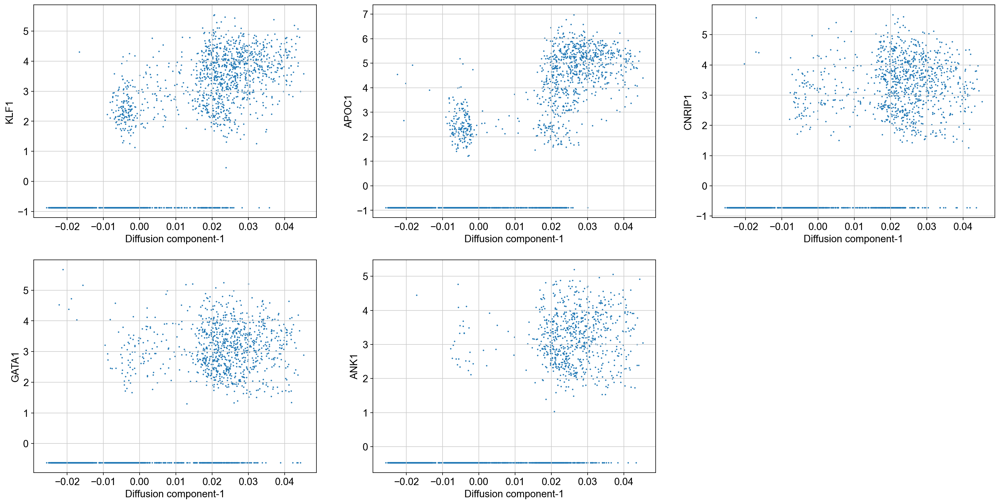

In [25]:
# Visualize the trend of top 5 genes along diffusion component 1:
top_genes = ['KLF1', 'APOC1', 'CNRIP1', 'GATA1', 'ANK1']
fig = plt.figure(figsize = (8*3, 6*2))
for j, gene in enumerate(top_genes):
    ax = fig.add_subplot(2, 3, j + 1)
    ax.scatter(adata_bm.obsm['X_diffmap'][:, 1], 
               adata_bm.X[:, adata_bm.var_names.get_loc(gene)], s = 1)
    ax.set_xlabel('Diffusion component-1', fontsize = 14)
    ax.set_ylabel(gene, fontsize = 14)


As we can see, KLF1, GATA1 are some of the highly correlated genes with diffusion component 1. Inspecting the top genes this way can help you get a sense of what each diffusion component is trying to explain.

We can now automate this for all the diffusion components of interest:

In [26]:
# Correlate with top 10 diffusion components
data = adata_bm.X

for diff_comp in range(1, 11):
    print(diff_comp)
    diff_temp = adata_bm.obsm['X_diffmap'][:, diff_comp]
    corr_score = np.empty(data.shape[1], dtype = np.float64)
    for j in range(data.shape[1]):
        corr_temp = np.corrcoef(data[:, j], diff_temp)
        corr_score[j] = corr_temp[0, 1]
    
    df_corr = pd.DataFrame({'corr_score': corr_score}, index = adata_bm.var.index)
    df_corr['absolute_corr_score'] = np.abs(df_corr['corr_score'])
    
    # save as csv:
    #df_corr.to_csv(output_directory + 'gene_correlation_with_diffusion_comp_' + str(diff_comp) + '.csv')

1


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


3


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


4


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


5


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


6


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


7


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


8


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


9


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


10


/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


## Palantir

Palantir is a graph-based method to align differentiating cells onto a pseudotime axis. Palantir models the differentiation landscape as a continuum (as opposed to a set of discrete stages) and aligns cells along an axis, automatically identifies and characterizes the terminal differentiated states, and assigns each cell a probablity of differentiating into one of the terminal states. 

The key inputs to the method are:

1. scRNA-seq data from a differentiating system
2. Start cell, i.e. where the differentiation starts
3. `k` or `n_neighbors` for graph construction.

We again recommend that you investigate and ensure that your pseudotime and branch probability results are robust to slight variations around input 2 and 3. You can consult Supplementary Figures 5-8 in the reference below:

Ref: https://www.nature.com/articles/s41587-019-0068-4

While palantir is integrated into scanpy as `sc.external.tl.palantir`, we suggest you import palantir by itself. The authors have made modifications for easier downstream analysis, which may not be up to date in Scanpy.

In [27]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap'
    varm: 'PCs'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities'

As part of the analysis, palantir first computes diffusion maps on the data, then scales the diffusion components based on their eigenvalues (please see the manuscript for more details). Then it uses the rescaled diffusion components to build the pseudotime.

In [29]:
!pip install palantir

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.0/96.0 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 2.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 5.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 6.1 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.7/29.7 MB 4.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 3.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.1/57.1 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 4.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 10.4 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully unins

In [30]:
import palantir

In [31]:
# first compute diffusion maps
palantir.utils.run_diffusion_maps(adata_bm, n_components=20);

In [32]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors'
    varm: 'PCs'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

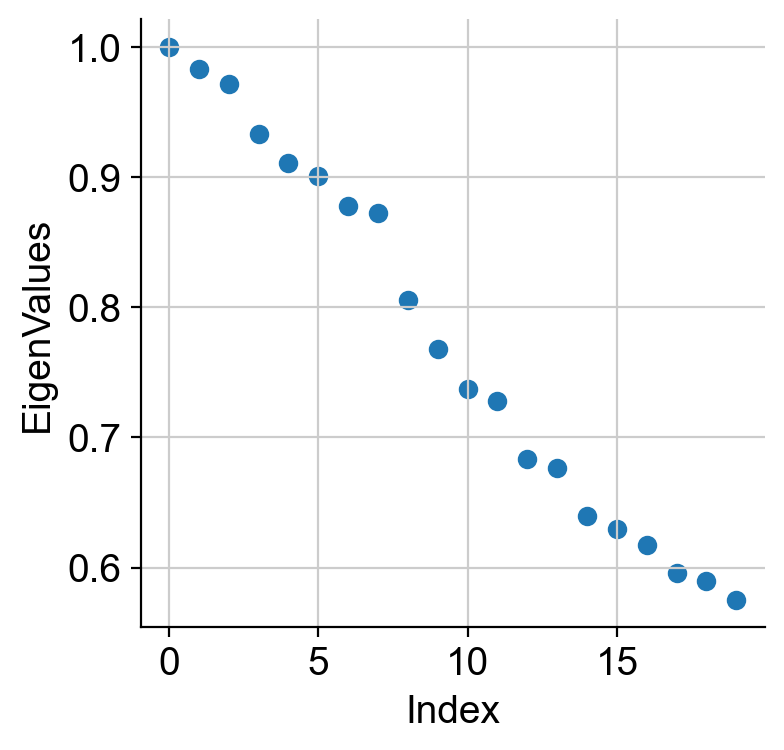

In [33]:
# visualize the eigenvalues:
plt.scatter(range(len(adata_bm.uns['DM_EigenValues'])), adata_bm.uns['DM_EigenValues'])
plt.xlabel('Index')
plt.ylabel('EigenValues')
plt.grid('on')

Like before we see a gap between 8th and 9th eigenvalues. Now, palantir will use this result to rescale the top N eigenvectors, which are chosen automatically (but can also be userdefined) based on the gap between eigenvalues as shown above.

In [34]:
palantir.utils.determine_multiscale_space(adata_bm);

In [35]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled'
    varm: 'PCs'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

In [36]:
adata_bm.obsm['DM_EigenVectors_multiscaled'].shape

(5780, 7)

As we suspected, palantir considered the first 8 eigenvectors (and it removes the 0th eigenvector) as the most meaningful and rescaled them based on their eigenvalues (for more details, please see the manuscript).

Color tSNE by top 8 diffusion maps:

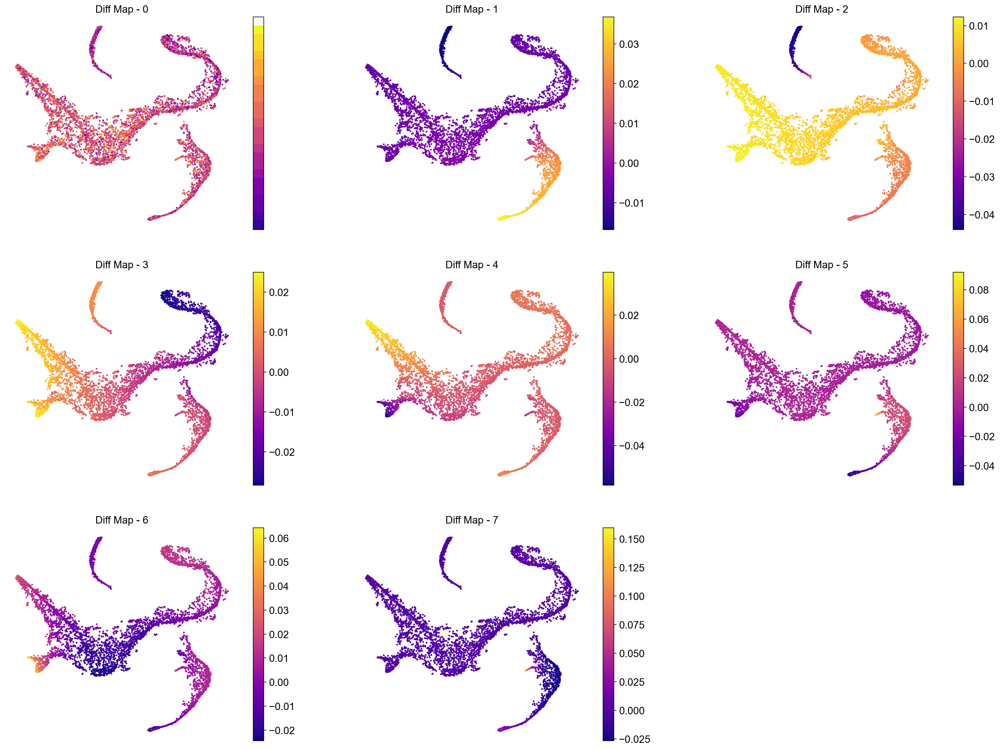

In [37]:
# Visualize the first 8 eigenvectors
ncol = 3
nrow = 3

fig = plt.figure(figsize = (8*ncol, 6*nrow))
for j in range(8):
    ax = fig.add_subplot(nrow, ncol, j + 1)
    im1 = ax.scatter(adata_bm.obsm['tsne'][:, 0], adata_bm.obsm['tsne'][:, 1], s = 2, 
                 c = adata_bm.obsm['DM_EigenVectors'][:, j], cmap = 'plasma')
    fig.colorbar(im1)
    ax.axis('off')
    ax.set_title('Diff Map - ' + str(j))
    
# To save: 
# fig.savefig(output_directory + 'umap_colored_by_diff_maps.png', bbox_inches = 'tight', dpi = 150)

Visualize genes for interpretation:

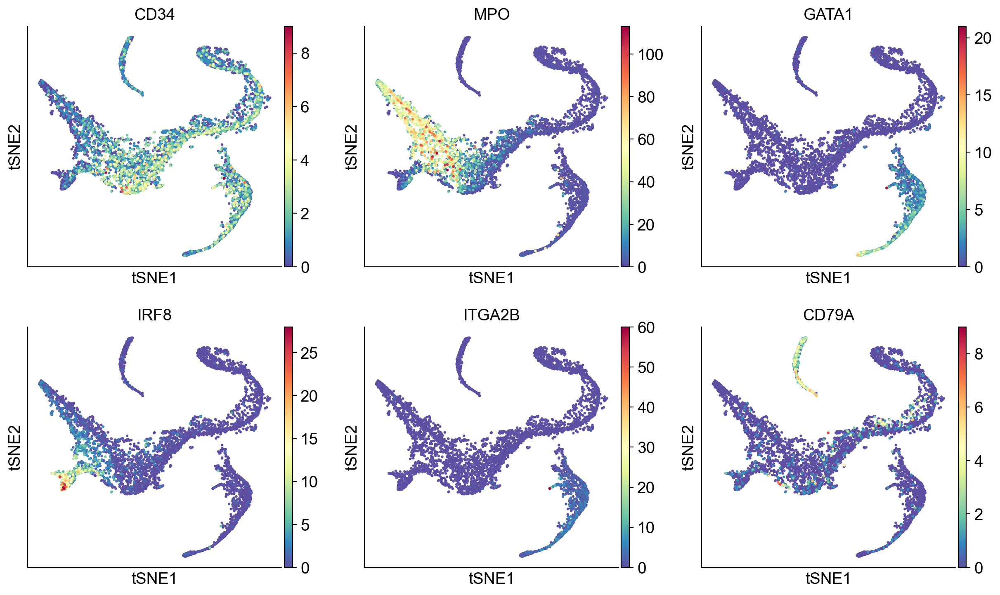

In [38]:
# Visualize some gene expression on the above tsne:
sc.pl.tsne(adata_bm, 
           color=['CD34', 'MPO', 'GATA1', 'IRF8', 'ITGA2B', 'CD79A'], ncols = 3)

### Define start cell

Palantir expects thatyou provide an example cell as a start point. The algorithm will use this cells as the initiating point of the trajectory but with each iteration, the start cell will be refined automatically. In other words, palantir is very robust to the choice of start cell, so it is OK that you only provide an approximate `start_cell`.

But how does one generally assign a start cell? This is a context dependent problem. In this data, the authors decided to find the cell with high expression of CD34 gene (the most primitive cell from Cluster 0) and define it as the start point. For this they selected a random cell from the highlighted region below. 

In [39]:
# Define a start point
# Please note that the start_cell should be the barcode of the cell estimated to be an ideal start point
start_cell = 'Run5_164698952452459'

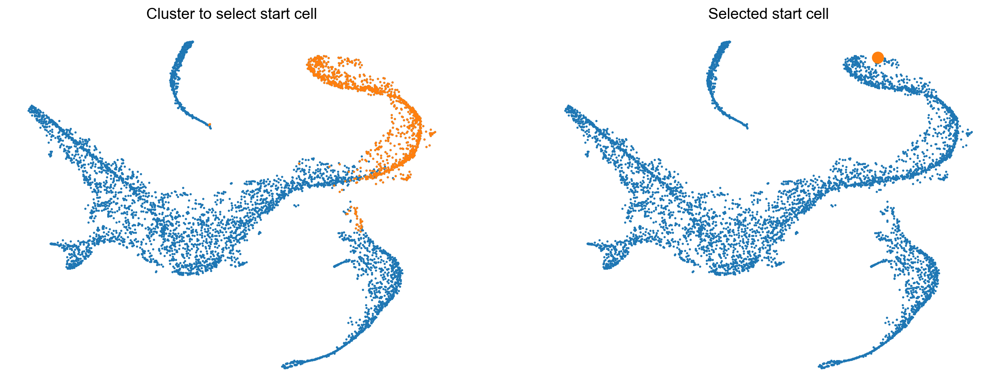

In [40]:
fig = plt.figure(figsize = (8*2, 6))
ax = fig.add_subplot(1, 2, 1)
select_cells = adata_bm.obs['clusters'] == '0'
ax.scatter(adata_bm.obsm['X_tsne'][:, 0], adata_bm.obsm['X_tsne'][:, 1], s = 1)
ax.scatter(adata_bm.obsm['X_tsne'][select_cells, 0], adata_bm.obsm['X_tsne'][select_cells, 1], s = 1)
ax.axis('off')
ax.set_title('Cluster to select start cell')

ax = fig.add_subplot(1, 2, 2)
select_cells = adata_bm.obs_names.get_loc(start_cell)
ax.scatter(adata_bm.obsm['X_tsne'][:, 0], adata_bm.obsm['X_tsne'][:, 1], s = 1)
ax.scatter(adata_bm.obsm['X_tsne'][select_cells, 0], adata_bm.obsm['X_tsne'][select_cells, 1], s = 100)
ax.axis('off')
ax.set_title('Selected start cell');

### Define terminal states

Palantir can automatically identify the terminal points, so you can begin your analysis by seeing what palantir identifies as terminal state(s). However, if you want to use biological intuition to identify possible terminal states, you can specify the cells which you think are likely terminal states. 

If you want a data driven way to identify potential terminal states then you can study the cells with the minimum and maximum values of the diffusion components. Since Palantir builds on the diffusion components, you can study the components itself to identify potential end states. Now, we will color the tSNE by diffusion components, and highlight the cells with min and max values for each component. 

Note: we only look at the first 8 diffusion component because the gap in eigenvalues is highest there, meaning that palantir will focus on these 8 components to derive a pseudotime.

In [41]:
adata_bm.obsm['DM_EigenVectors_multiscaled'].shape

(5780, 7)

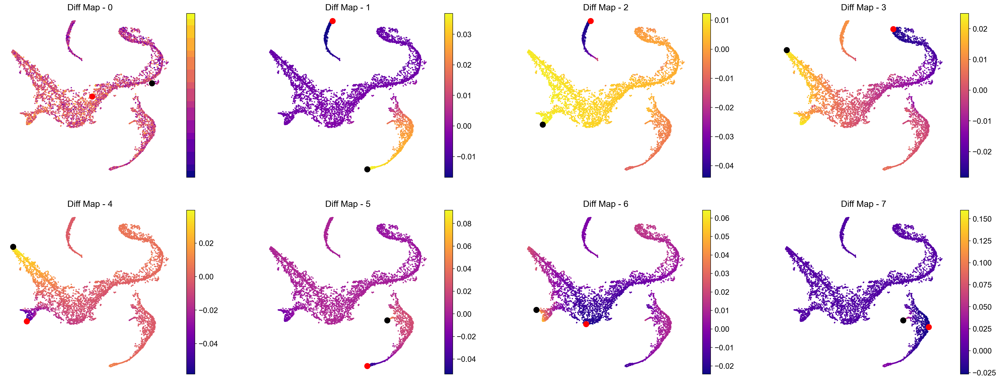

In [42]:
# Visualize the first 8 eigenvectors (Note: we ignore the 0th so 7 really)
ncol = 4
nrow = 2

fig = plt.figure(figsize = (8*ncol, 6*nrow))
for j in range(8):
    ax = fig.add_subplot(nrow, ncol, j + 1)
    im1 = ax.scatter(adata_bm.obsm['tsne'][:, 0], adata_bm.obsm['tsne'][:, 1], s = 2, 
                 c = adata_bm.obsm['DM_EigenVectors'][:, j], cmap = 'plasma')
    
    [id_min, id_max] = np.argsort(adata_bm.obsm['DM_EigenVectors'][:, j])[[0, -1]]
    
    ax.scatter(adata_bm.obsm['tsne'][id_min, 0], 
               adata_bm.obsm['tsne'][id_min, 1], s = 100, c = 'r')
    
    ax.scatter(adata_bm.obsm['tsne'][id_max, 0], 
               adata_bm.obsm['tsne'][id_max, 1], s = 100, c = 'k')
    
    fig.colorbar(im1)
    ax.axis('off')
    ax.set_title('Diff Map - ' + str(j), fontsize = 16)
    
# To save: 
# fig.savefig(output_directory + 'umap_colored_by_diff_maps.png', bbox_inches = 'tight', dpi = 150)

In the plot above the tsne representation of the data is colored by each diffusion component. The cells with minimum value for the diffusion component is highlighted in red, while the cells with the maximum value for the diffusion component is highlighted is black. For the plots above, we can speculate that the potential terminal states are as follows after taking care of duplicates:

1) min and max of diffusion component 1

2) max of diffusion component 2

3) max of diffusion component 3

4) max of diffusion component 5

5) max of diffusion component 6

We are making this claim, also based on the gene expression and cell types in each of these terminal states. So, when you adapt this code for your own data, we suggest that you study your data based on gene expression and as above where we looked at the cells with minimum and maximum values for each diffusion component.

Let's get the cell barcode for the cells corresponding to the minimum and maximum values of the above mentioned diffusion components. 

In [43]:
terminal_states = []

# for component 1
cell_comp1 = np.argsort(adata_bm.obsm['DM_EigenVectors'][:, 1])[[0, -1]]
terminal_states = terminal_states + list(adata_bm.obs_names[cell_comp1])

# for component 2
cell_comp2 = np.argsort(adata_bm.obsm['DM_EigenVectors'][:, 2])[-1]
terminal_states.append(adata_bm.obs_names[cell_comp2])


# for component 3
cell_comp3 = np.argsort(adata_bm.obsm['DM_EigenVectors'][:, 3])[-1]
terminal_states.append(adata_bm.obs_names[cell_comp3])

# for component 5
cell_comp5 = np.argsort(adata_bm.obsm['DM_EigenVectors'][:, 5])[-1]
terminal_states.append(adata_bm.obs_names[cell_comp5])

# for component 6
cell_comp6 = np.argsort(adata_bm.obsm['DM_EigenVectors'][:, 6])[-1]
terminal_states.append(adata_bm.obs_names[cell_comp6])

In [44]:
terminal_states

['Run4_239448276221238',
 'Run4_236650105264556',
 'Run5_239477254471070',
 'Run4_130736318737710',
 'Run5_191691434420467',
 'Run4_200967489997038']

Visualize start and terminal states on tsne:

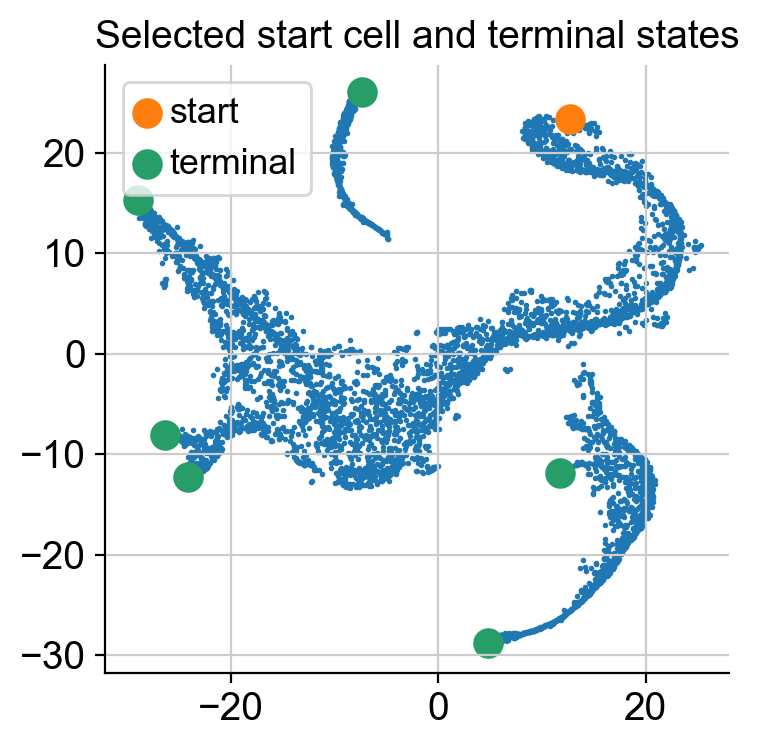

In [45]:
select_cell_start = adata_bm.obs_names.get_loc(start_cell)
select_cell_terminal = [adata_bm.obs_names.get_loc(j) for j in terminal_states]

plt.scatter(adata_bm.obsm['X_tsne'][:, 0], adata_bm.obsm['X_tsne'][:, 1], s = 1)
plt.scatter(adata_bm.obsm['X_tsne'][select_cell_start, 0], 
            adata_bm.obsm['X_tsne'][select_cell_start, 1], s = 100, label = 'start')
plt.scatter(adata_bm.obsm['X_tsne'][select_cell_terminal, 0], 
            adata_bm.obsm['X_tsne'][select_cell_terminal, 1], s = 100, label = 'terminal')
plt.title('Selected start cell and terminal states');
plt.legend()

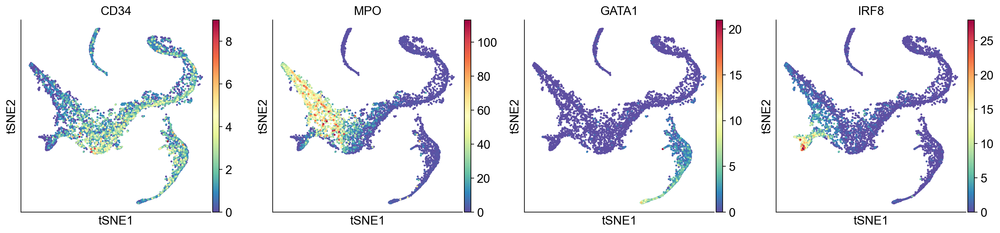

In [46]:
# Visualize some gene expression on the above tsne:
sc.pl.tsne(adata_bm, 
           color=['CD34', 'MPO', 'GATA1', 'IRF8'])

### Compute pseudotime

In [47]:
pr_res = palantir.core.run_palantir(adata_bm, 
                                    early_cell = start_cell, 
                                    terminal_states=terminal_states)

Sampling and flocking waypoints...
Time for determining waypoints: 0.005348682403564453 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.8863316337267558 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9996
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [50]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities'
    varm: 'PCs'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

Now to further process pr_res, we will follow: https://nbviewer.org/github/dpeerlab/Palantir/blob/master/notebooks/Palantir_sample_notebook.ipynb

Palantir generates the following results

- `palantir_pseudotime`: Pseudo time ordering of each cell
- `palantir_fate_probabilities`: Matrix of cells X terminal states. Each entry represents the probability of the corresponding cell reaching the respective terminal state
- `palantir_entropy`: A quantiative measure of the differentiation potential of each cell computed as the entropy of the multinomial terminal state probabilities

### Get the pseudotime

In [51]:
adata_bm.obs['palantir_pseudotime']

index
Run4_120703408880541    0.550738
Run4_120703409056541    0.074225
Run4_120703409580963    0.752128
Run4_120703423990708    0.722782
Run4_120703424252854    0.564369
                          ...   
Run5_241114589051630    0.857101
Run5_241114589051819    0.413827
Run5_241114589128940    0.472308
Run5_241114589357942    0.887548
Run5_241114589841822    0.470172
Name: palantir_pseudotime, Length: 5780, dtype: float64

In the output above, each row is a cell barcode and the number associated with each cell is it's pseudotime alignment score (between 0 representing early and 1 representing differentiated).

In [52]:
# Get the branch probabilities
# As shown below, palantir used the 6 terminally differentiated states
adata_bm.obsm['palantir_fate_probabilities']

,Run4_130736318737710,Run4_200967489997038,Run4_236650105264556,Run4_239448276221238,Run5_191691434420467,Run5_239477254471070
index,,,,,,
Run4_120703408880541,0.166378,0.033098,0.692449,0.000000,0.035484,0.068032
Run4_120703409056541,0.392431,0.077788,0.310796,0.026885,0.032207,0.159892
Run4_120703409580963,0.938346,0.011350,0.023633,0.000000,0.000000,0.023331
Run4_120703423990708,0.874245,0.023151,0.048204,0.000000,0.000000,0.047587
Run4_120703424252854,0.406759,0.118921,0.201461,0.000000,0.021106,0.244437
...,...,...,...,...,...,...
Run5_241114589051630,0.024373,0.000000,0.954936,0.000000,0.000000,0.000000
Run5_241114589051819,0.436307,0.086823,0.261348,0.000000,0.027347,0.178463
Run5_241114589128940,0.420652,0.083913,0.283884,0.000000,0.029924,0.172480


In [53]:
# You can rename the different branches:
adata_bm.obsm['palantir_fate_probabilities'].columns = ['Branch1', 'Branch2', 'Branch3', 'Branch4', 'Branch5', 'Branch6']

In [54]:
# Get the entropy
adata_bm.obs['palantir_entropy']

index
Run4_120703408880541    0.991592
Run4_120703409056541    1.429927
Run4_120703409580963    0.307683
Run4_120703423990708    0.533640
Run4_120703424252854    1.403655
                          ...   
Run5_241114589051630    0.238597
Run5_241114589051819    1.375757
Run5_241114589128940    1.380736
Run5_241114589357942    0.160424
Run5_241114589841822    1.371430
Name: palantir_entropy, Length: 5780, dtype: float64

### Visualize the pseudotime

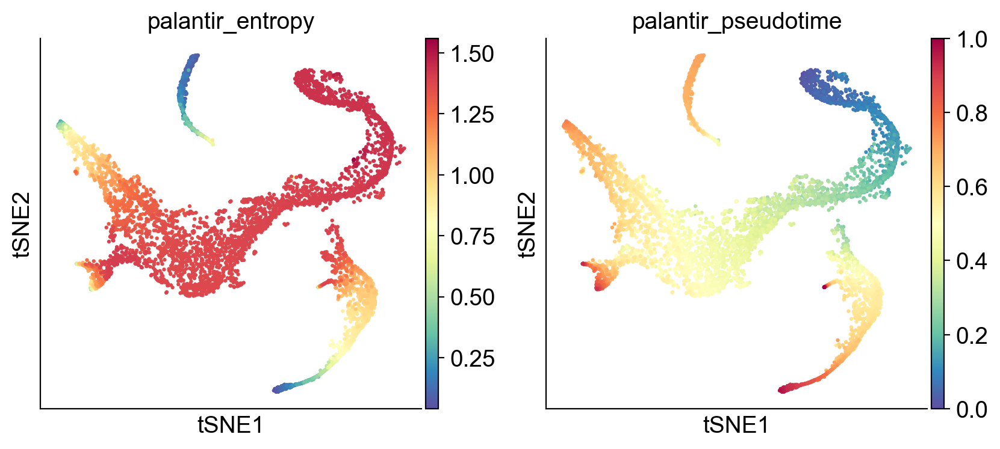

In [55]:
sc.pl.tsne(adata_bm, color = ['palantir_entropy', 'palantir_pseudotime'])

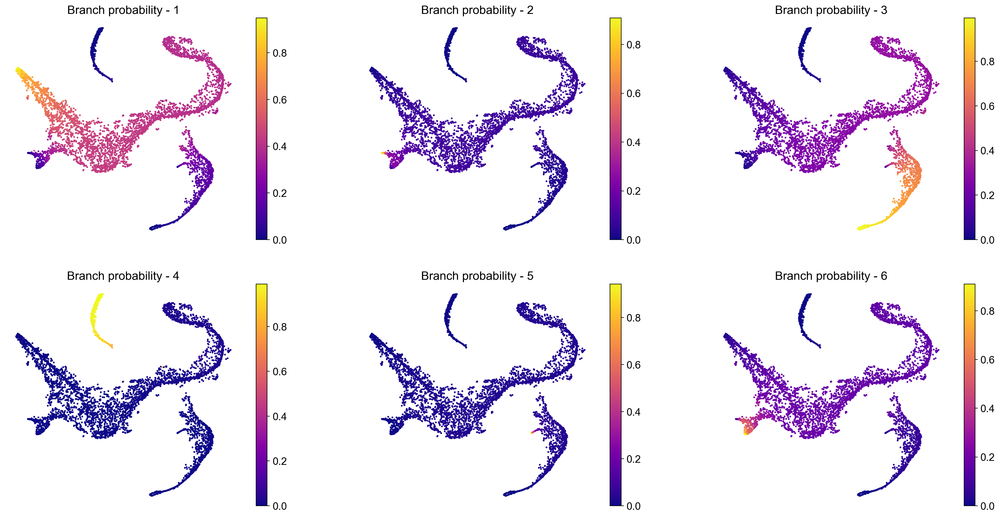

In [56]:
# Visualize branch probability
nrow = 2
ncol = 3
fig = plt.figure(figsize = (8*ncol, 6*nrow))
for j, item in enumerate(pr_res.branch_probs.columns):
    ax = fig.add_subplot(nrow, ncol, j+1)
    im1 = ax.scatter(adata_bm.obsm['X_tsne'][:, 0], adata_bm.obsm['X_tsne'][:, 1], 
              c = adata_bm.obsm['palantir_fate_probabilities'][item], s = 2, cmap = 'plasma')
    ax.axis('off')
    ax.set_title('Branch probability - ' + str(j + 1), fontsize = 16)
    fig.colorbar(im1)

### Visualize the probability for cells to reach certain terminal state

Text(0.5, 1.0, 'Run4_121896095574750')

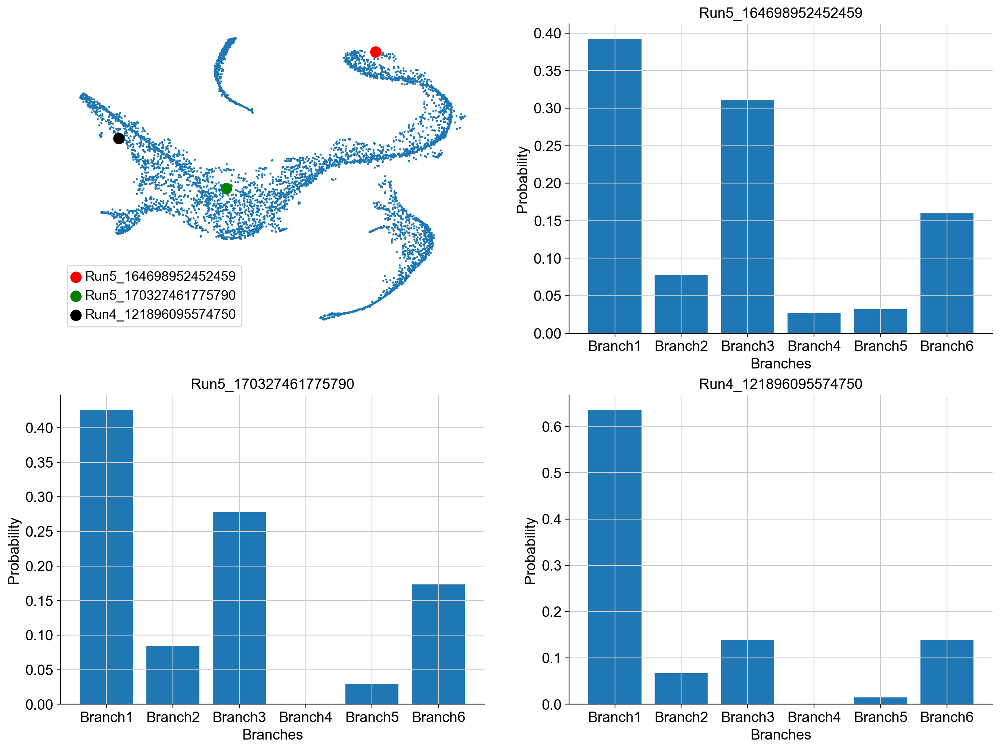

In [57]:
example_cells = ["Run5_164698952452459", "Run5_170327461775790", "Run4_121896095574750"]
fig = plt.figure(figsize = (8*2, 6*2))
ax = fig.add_subplot(2, 2, 1)
cell_id = [adata_bm.obs_names.get_loc(k) for k in example_cells]
ax.scatter(adata_bm.obsm['X_tsne'][:, 0], adata_bm.obsm['X_tsne'][:, 1], s = 1)
ax.scatter(adata_bm.obsm['X_tsne'][cell_id[0], 0], adata_bm.obsm['X_tsne'][cell_id[0], 1], s = 100, 
          c = 'r', label = example_cells[0])
ax.scatter(adata_bm.obsm['X_tsne'][cell_id[1], 0], adata_bm.obsm['X_tsne'][cell_id[1], 1], s = 100, 
          c = 'g', label = example_cells[1])
ax.scatter(adata_bm.obsm['X_tsne'][cell_id[2], 0], adata_bm.obsm['X_tsne'][cell_id[2], 1], s = 100, 
          c = 'k', label = example_cells[2])
ax.axis('off')
ax.legend()

ax = fig.add_subplot(2, 2, 2)
ax.bar(adata_bm.obsm['palantir_fate_probabilities'].columns, 
       adata_bm.obsm['palantir_fate_probabilities'].loc[example_cells[0]])
ax.set_xlabel('Branches')
ax.set_ylabel('Probability')
ax.set_title(example_cells[0])

ax = fig.add_subplot(2, 2, 3)
ax.bar(adata_bm.obsm['palantir_fate_probabilities'].columns, 
       adata_bm.obsm['palantir_fate_probabilities'].loc[example_cells[1]])
ax.set_xlabel('Branches')
ax.set_ylabel('Probability')
ax.set_title(example_cells[1])

ax = fig.add_subplot(2, 2, 4)
ax.bar(adata_bm.obsm['palantir_fate_probabilities'].columns, 
       adata_bm.obsm['palantir_fate_probabilities'].loc[example_cells[2]])
ax.set_xlabel('Branches')
ax.set_ylabel('Probability')
ax.set_title(example_cells[2])

### Visualize gene expression trends

Palantir allows us to study the gene expression trends along each of the branches or the pseudotime. This can help us identify regions along the pseudotime when gene expression change substantially, which can be informative about the biology of the system.  

First, you can choose a branch to highlight:

In [58]:
masks = palantir.presults.select_branch_cells(adata_bm, eps=0)

In [59]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'PCs'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

In [60]:
adata_bm.obsm['branch_masks']

,Branch1,Branch2,Branch3,Branch4,Branch5,Branch6
index,,,,,,
Run4_120703408880541,False,False,True,False,False,False
Run4_120703409056541,False,False,False,False,False,False
Run4_120703409580963,True,False,False,False,False,False
Run4_120703423990708,True,False,False,False,False,False
Run4_120703424252854,False,False,False,False,False,False
...,...,...,...,...,...,...
Run5_241114589051630,False,False,True,False,False,False
Run5_241114589051819,False,True,False,False,False,True
Run5_241114589128940,False,False,False,False,False,False


Visualizing the branch selection:

In [61]:
help(palantir.plot.plot_branch_selection)

Help on function plot_branch_selection in module palantir.plot:

plot_branch_selection(ad: anndata._core.anndata.AnnData, pseudo_time_key: str = 'palantir_pseudotime', fate_prob_key: str = 'palantir_fate_probabilities', masks_key: str = 'branch_masks', fates: Union[List[str], str, NoneType] = None, embedding_basis: str = 'X_umap', figsize: Tuple[float, float] = (15, 5), **kwargs)
    Plot cells along specific fates of pseudotime ordering and the UMAP embedding.
    
    Parameters
    ----------
    ad : sc.AnnData
        Annotated data matrix. The pseudotime and fate probabilities should be stored under the keys provided.
    pseudo_time_key : str, optional
        Key to access the pseudotime from obs of the AnnData object. Default is 'palantir_pseudotime'.
    fate_prob_key : str, optional
        Key to access the fate probabilities from obsm of the AnnData object.
        Default is 'palantir_fate_probabilities'.
    masks_key : str, optional
        Key to access the branch cell

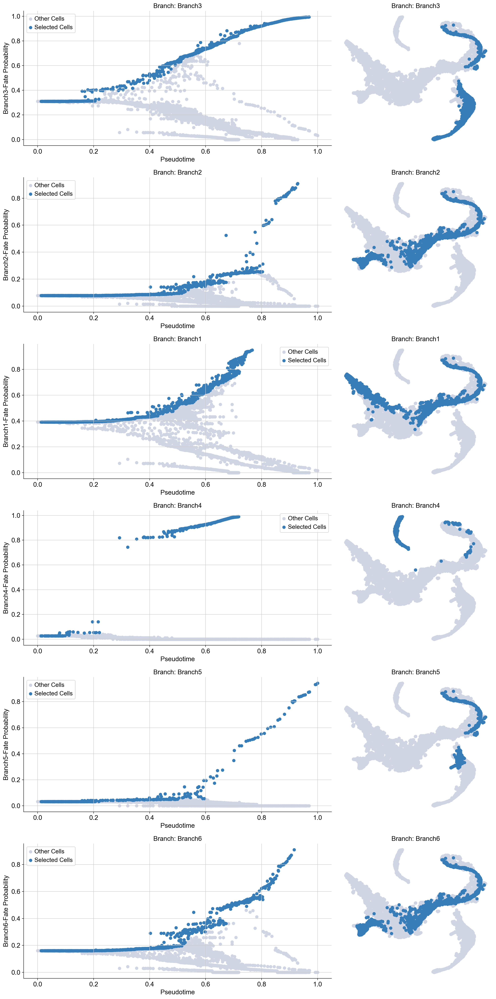

In [62]:
palantir.plot.plot_branch_selection(adata_bm, embedding_basis = 'tsne')
plt.show()

Now we can compute the gene expression trend along the trajectory.

In [63]:
gene_trends = palantir.presults.compute_gene_trends(adata_bm)#, expression_key="magic_imputed_data")

Branch1
[2024-11-07 22:58:32,311] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (1,444) and rank = 1.0.
[2024-11-07 22:58:32,312] [INFO    ] Using covariance function Matern52(ls=1.0).
Branch2
[2024-11-07 22:58:35,021] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (1,361) and rank = 1.0.
[2024-11-07 22:58:35,021] [INFO    ] Using covariance function Matern52(ls=1.0).
Branch3
[2024-11-07 22:58:36,951] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (1,240) and rank = 1.0.
[2024-11-07 22:58:36,953] [INFO    ] Using covariance function Matern52(ls=1.0).
Branch4
[2024-11-07 22:58:39,120] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (540) and rank = 1.0.
[2024-11-07 22:58:39,122] [INFO    ] Using covariance function Matern52(ls=1.0).
Branch5
[2024-11-07 22:58:40,712] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (500) >= n_samples (476) and rank = 1.0.


In [64]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'PCs', 'gene_trends_Branch1', 'gene_trends_Branch2', 'gene_trends_Branch3', 'gene_trends_Branch4', 'gene_trends_Branch5', 'gene_trends_Branch6'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

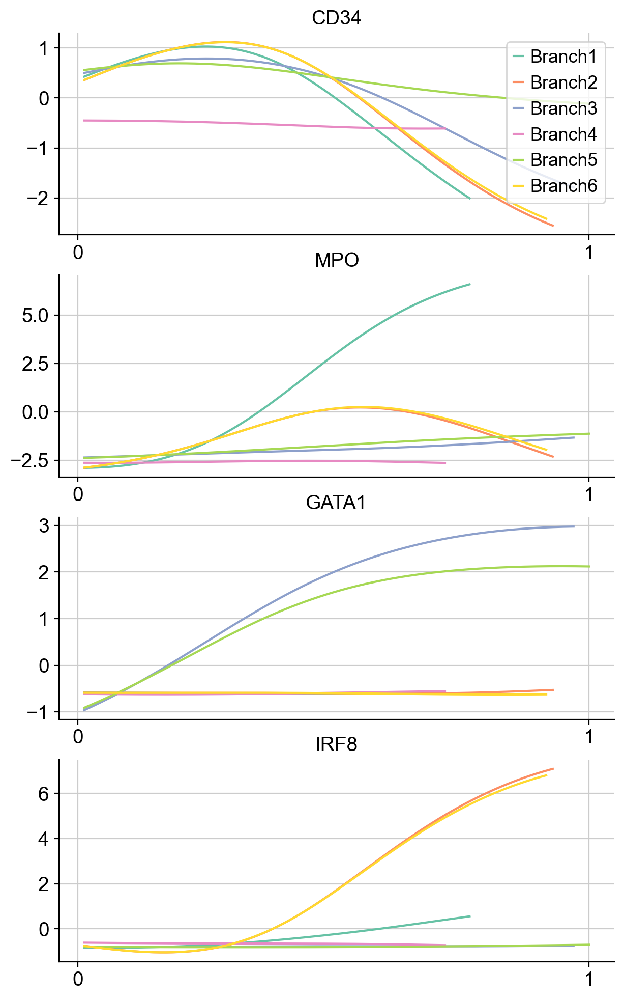

In [65]:
genes = ["CD34", "MPO", "GATA1", "IRF8"]
palantir.plot.plot_gene_trends(adata_bm, genes)
plt.show()

As heatmaps:

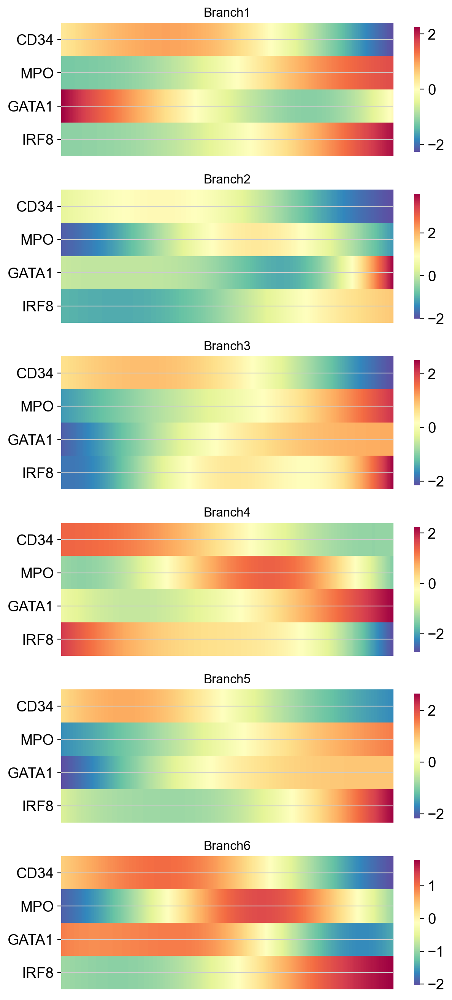

In [66]:
palantir.plot.plot_gene_trend_heatmaps(adata_bm, genes)
plt.show()

### Clustering gene expression trends

It may also be informative to group genes together based on how they trend along the pseudotime. For exposition, we will randomly sample 1000 genes from the data and cluster them based on how they trend along Branch1.

In [67]:
import random
sample_genes = list(random.sample(list(adata_bm.var_names), 1000))

In [68]:
help(palantir.presults.cluster_gene_trends)

Help on function cluster_gene_trends in module palantir.presults:

cluster_gene_trends(data: Union[anndata._core.anndata.AnnData, pandas.core.frame.DataFrame], branch_name: str, genes: Optional[List[str]] = None, gene_trend_key: Optional[str] = 'gene_trends', n_neighbors: int = 150, **kwargs) -> pandas.core.series.Series
    Cluster gene trends using the Leiden algorithm.
    
    This function applies the Leiden clustering algorithm to gene expression trends
    along the pseudotemporal trajectory. If the input is an AnnData object, it uses
    the gene trends stored in the `varm` attribute accessed using the `gene_trend_key`.
    If the input is a DataFrame, it directly uses the input data for clustering.
    
    Parameters
    ----------
    data : Union[sc.AnnData, pd.DataFrame]
        AnnData object or a DataFrame of gene expression trends.
    branch_name : str
        Name of the branch for which the gene trends are to be clustered.
    genes : list of str, optional
        Li

In [69]:
communities = palantir.presults.cluster_gene_trends(adata_bm, 
                                                    branch_name = "Branch1", 
                                                    genes = sample_genes)

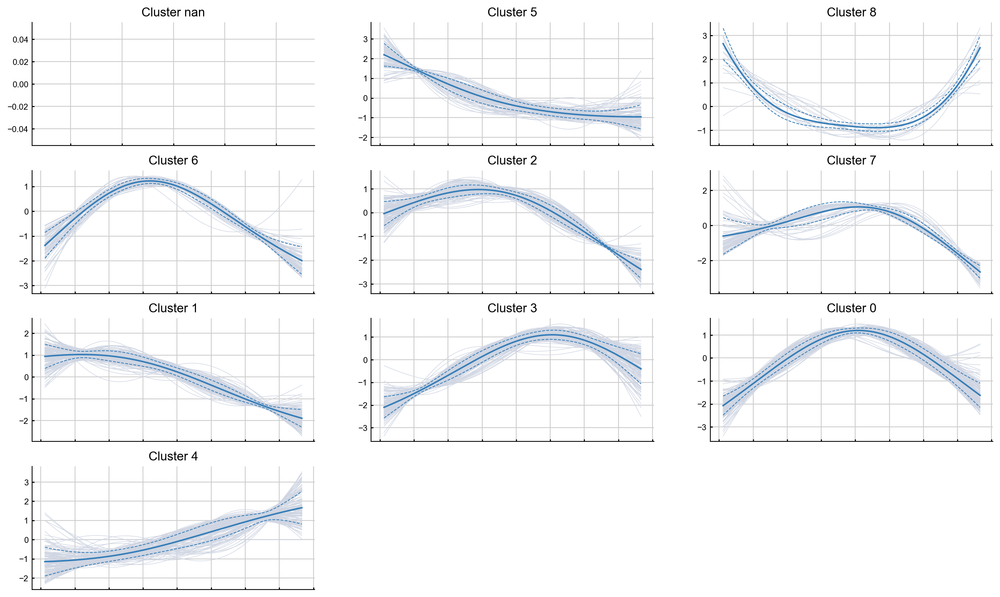

In [70]:
palantir.plot.plot_gene_trend_clusters(adata_bm, "Branch1")
plt.show()

## PAGA

PAGA (PArtition-based Graph Abstraction) is another method that can be used to study connectivities in single-cell data. Often, studying cell differentiation process using pseudotime may not be optimal due to issues resulting from inadequate sampling of cells. In such cases, the notion of connecting clusters of cells using graph-based metrics (to avoid errors that Euclidean distance might cause) has been proposed as an alternative, and PAGA is one such method. PAGA attempts to preserve both continuous and disconnected structure in the data. 

Ref: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6425583/

PAGA relies on both clustering and nearest neighbor graphs (which can be constructed on PCA or on diffusion components). We will provide code to do both.

In [71]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    var: 'gene_trends_clusters'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'PCs', 'gene_trends_Branch1', 'gene_trends_Branch2', 'gene_trends_Branch3', 'gene_trends_Branch4', 'gene_trends_Branch5', 'gene_trends_Branch6'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

/Users/sara.jimenez/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


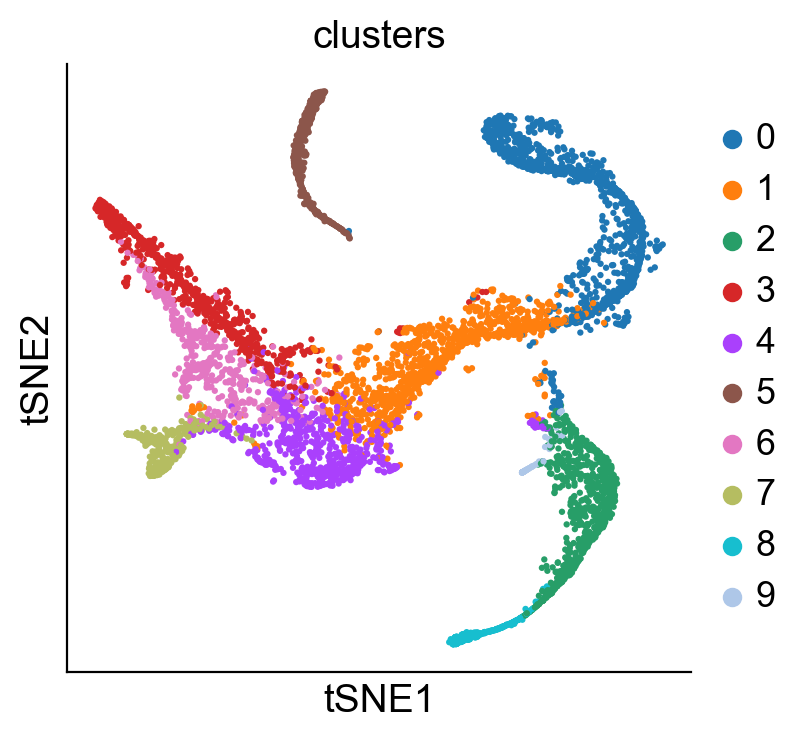

In [72]:
sc.pl.tsne(adata_bm, color = 'clusters')

In [73]:
# We are computing 300 principal components as that is what the authors used. 
# The rationale was that they wanted to consider enough PCs to explain 75% of the variance in the data
sc.tl.pca(adata_bm, n_comps = 300)

In [74]:
# Compute nearest neighbors 
sc.pp.neighbors(adata_bm, n_neighbors=30, use_rep = 'X_pca', metric='euclidean', key_added='neighbors_30')

### PAGA with distances computed on PCA

Since we have already computed k-nearest neighbor distance graph on the PCA, we can simply invoke that result.

In [75]:
sc.tl.paga(adata_bm, groups='clusters', neighbors_key = 'neighbors_30')

In [76]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    var: 'gene_trends_clusters'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints', 'paga', 'clusters_sizes'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'PCs', 'gene_trends_Branch1', 'gene_trends_Branch2', 'gene_trends_Branch3', 'gene_trends_Branch4', 'gene_trends_Branch5', 'gene_trends_Branch6'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

In [77]:
adata_bm.uns['paga']

{'connectivities': <10x10 sparse matrix of type '<class 'numpy.float64'>'
 	with 74 stored elements in Compressed Sparse Row format>,
 'connectivities_tree': <10x10 sparse matrix of type '<class 'numpy.float64'>'
 	with 9 stored elements in Compressed Sparse Row format>,
 'groups': 'clusters'}

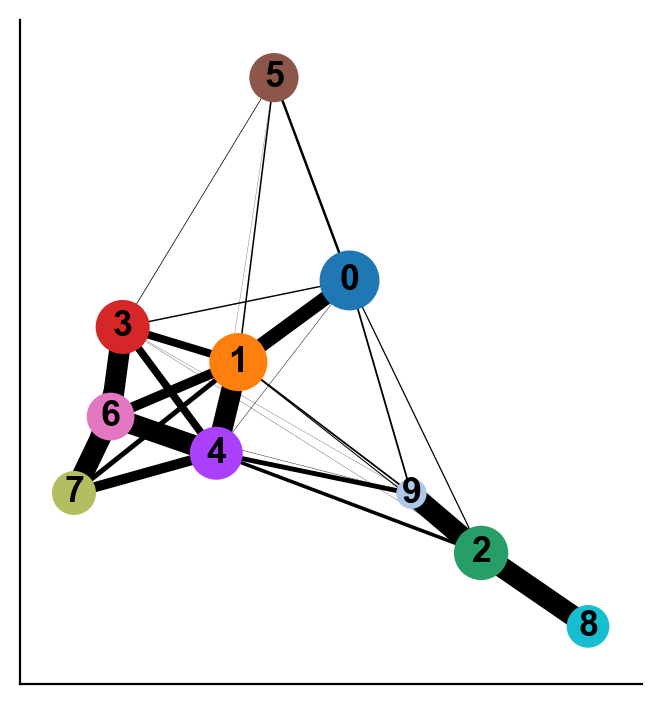

In [78]:
sc.pl.paga(adata_bm, color=['clusters'], node_size_scale = 2)

Interpreting the plot above:
1. Each circle indicates a cluster and the size of the circle is proportional to size of the cluster.
2. Two circles that are phenotypically close to each other - as quantified by the distances computed on the PCA space - are connected to each other. 
3. The width of the connecting edges is proportional to the similarity between the clusters.


We can also highlight the expression of select genes onto the PAGA plot as follows:

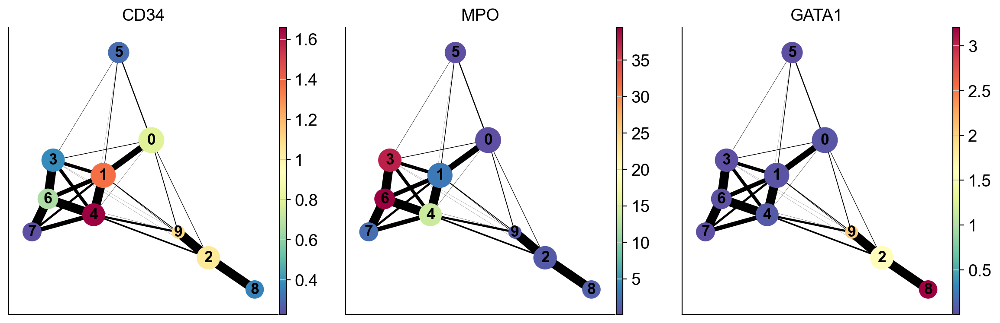

In [79]:
sc.pl.paga(adata_bm, color = ['CD34', 'MPO', 'GATA1'], node_size_scale = 2)

### PAGA on diffusion components

As we discussed above, PAGA can also compute connectivites between clusters based on distances in the diffusion space. For the example, below we will consider distances in the diffusion space defined by the first seven eigenvectors (ignoring the 0th eigenvector -- automatically ignored by PAGA).

In [80]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    var: 'gene_trends_clusters'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints', 'paga', 'clusters_sizes'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'PCs', 'gene_trends_Branch1', 'gene_trends_Branch2', 'gene_trends_Branch3', 'gene_trends_Branch4', 'gene_trends_Branch5', 'gene_trends_Branch6'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity'

In [81]:
sc.tl.diffmap(adata_bm, n_comps=30, neighbors_key = 'neighbors_30')

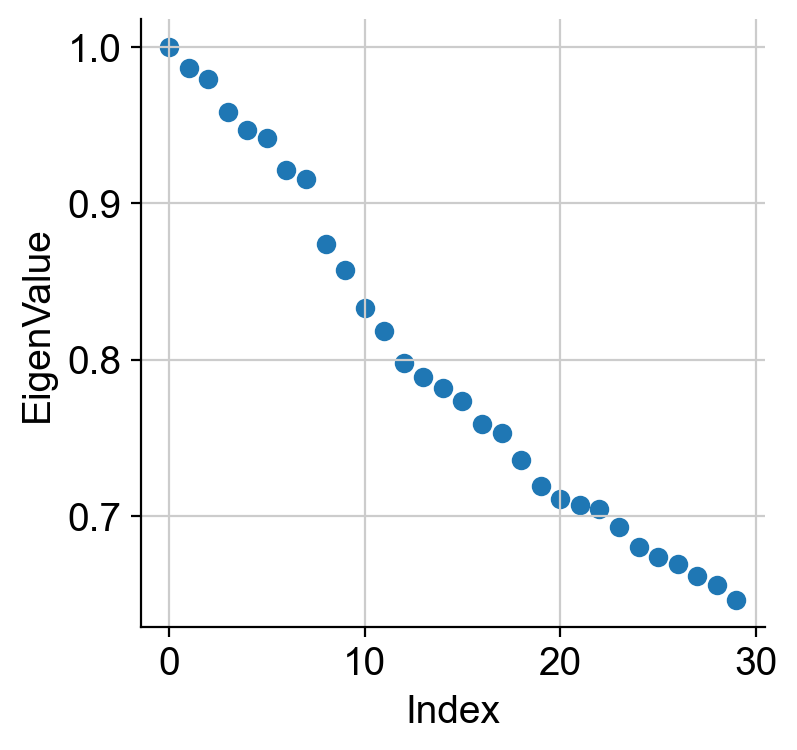

In [82]:
plt.scatter(range(len(adata_bm.uns['diffmap_evals'])), adata_bm.uns['diffmap_evals'])
plt.xlabel('Index')
plt.ylabel('EigenValue')
plt.grid('on')

Based on the above plot, we will consider only the top 7 components:

In [83]:
adata_bm.obsm['diffmap_evecs'] = adata_bm.obsm['X_diffmap'][:, 1:8]
adata_bm.uns['diffmap_evals'] = adata_bm.uns['diffmap_evals'][1:8]

In [84]:
adata_bm.obsm['diffmap_evecs'].shape

(5780, 7)

Compute neighbors in diffusion components space:

In [85]:
sc.pp.neighbors(adata_bm, n_neighbors=30, use_rep='diffmap_evecs', key_added = 'diff_neighbors')

Re-do PAGA on diffusion map space:

In [86]:
sc.tl.paga(adata_bm, groups='clusters', neighbors_key = 'diff_neighbors')

In [87]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    var: 'gene_trends_clusters'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints', 'paga', 'clusters_sizes', 'diff_neighbors'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks', 'diffmap_evecs'
    varm: 'PCs', 'gene_trends_Branch1', 'gene_trends_Branch2', 'gene_trends_Branch3', 'gene_trends_Branch4', 'gene_trends_Branch5', 'gene_trends_Branch6'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity', 'diff_neighbors_distances', 'diff_neighbors_connectivities'

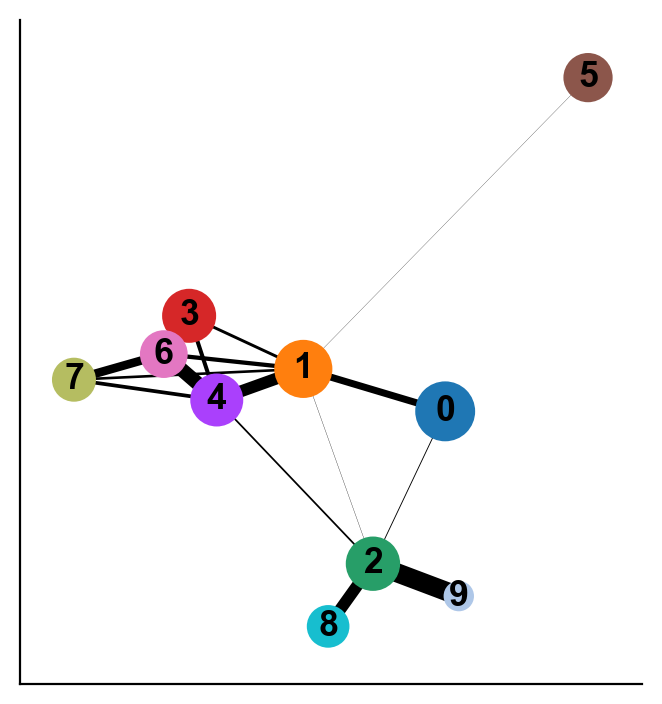

In [88]:
sc.pl.paga(adata_bm, node_size_scale = 2)

As you can see the two results of PAGA look visually quite similar (except that cluster 9 was more connected to other clusters when computing distances in the PCA space vs when computing in the diffusion space). It will be up to you to evaluate such cases using what is known about the cell types. In this case, Cluster 9 is ITGA2B+ (Megakaryocytes) and it is more phenotypically closer to cluster 2 and 8 as opposed to clusters 1 and 4. Therefore, diffusion distance based PAGA would be more faithful representation of the data here. 

## Using results to quantify distance between clusters

You can extract the similarity between clusters using diffusion maps space as follows. We see 0 when two clusters are not connected to each other in PAGA.

In [89]:
df = pd.DataFrame(adata_bm.uns['paga']['connectivities'].toarray(),
             index = ['Cluster-' + str(j) for j in np.unique(adata_bm.obs['clusters'])], 
             columns = ['Cluster-' + str(j) for j in np.unique(adata_bm.obs['clusters'])])

df

,Cluster-0,Cluster-1,Cluster-2,Cluster-3,Cluster-4,Cluster-5,Cluster-6,Cluster-7,Cluster-8,Cluster-9
Cluster-0,0.000000,0.335746,0.042759,0.008247,0.004014,0.008583,0.000415,0.000000,0.000000,0.001461
Cluster-1,0.335746,0.000000,0.014329,0.140419,0.569995,0.011620,0.204404,0.125988,0.000000,0.003320
Cluster-2,0.042759,0.014329,0.000000,0.000000,0.083675,0.000000,0.000626,0.000000,0.564495,0.917967
Cluster-3,0.008247,0.140419,0.000000,0.000000,0.193001,0.006204,0.940253,0.005905,0.000000,0.000000
Cluster-4,0.004014,0.569995,0.083675,0.193001,0.000000,0.001533,0.678286,0.178738,0.000000,0.007358
Cluster-5,0.008583,0.011620,0.000000,0.006204,0.001533,0.000000,0.000000,0.000000,0.000000,0.000000
Cluster-6,0.000415,0.204404,0.000626,0.940253,0.678286,0.000000,0.000000,0.411622,0.000000,0.000000
Cluster-7,0.000000,0.125988,0.000000,0.005905,0.178738,0.000000,0.411622,0.000000,0.000000,0.000000
Cluster-8,0.000000,0.000000,0.564495,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Cluster-9,0.001461,0.003320,0.917967,0.000000,0.007358,0.000000,0.000000,0.000000,0.000000,0.000000


Note: We can always repurpose this code to define distance or similarity between any two groups of cells by just replacing `clusters` column in obs with whatever grouping of cells we want.

Alternatively, for data where cells are along a continuum, we can use the diffusion components to compute phenotypic distances between cells or clusters. As we discussed, Euclidean distance in the diffusion component space is a good approximation for phenotypic distance between cells. Of course, we need to be careful with only the meaningful diffusion components (e.g. in the above case we will use diffusion components 1-7). 

In the following code, we will compute distance (A) between each pair of cells within cluster 0 (B) between cells in cluster 0 and cluster 1. 

In [90]:
adata_bm

AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'palantir_entropy'
    var: 'gene_trends_clusters'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'clusters_colors', 'pca', 'neighbors_30', 'diffmap_evals', 'DM_EigenValues', 'palantir_waypoints', 'paga', 'clusters_sizes', 'diff_neighbors'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_tsne', 'X_pca', 'X_diffmap', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks', 'diffmap_evecs'
    varm: 'PCs', 'gene_trends_Branch1', 'gene_trends_Branch2', 'gene_trends_Branch3', 'gene_trends_Branch4', 'gene_trends_Branch5', 'gene_trends_Branch6'
    obsp: 'neighbors_30_distances', 'neighbors_30_connectivities', 'DM_Kernel', 'DM_Similarity', 'diff_neighbors_distances', 'diff_neighbors_connectivities'

In [91]:
adata_bm.obsm['diffmap_evecs'].shape

(5780, 7)

In [92]:
cells_C0 = np.where(adata_bm.obs['clusters'] == '0')[0]
cells_C1 = np.where(adata_bm.obs['clusters'] == '1')[0]

In [93]:
print(len(cells_C0), len(cells_C1))

1118 984


In [94]:
from sklearn.metrics import pairwise_distances
distance_pairwise_C0 = pairwise_distances(adata_bm.obsm['diffmap_evecs'][cells_C0, :])
distance_pairwise_C0_C1 = pairwise_distances(adata_bm.obsm['diffmap_evecs'][cells_C0, :], 
                                             adata_bm.obsm['diffmap_evecs'][cells_C1, :])

In [95]:
print(distance_pairwise_C0.shape, distance_pairwise_C0_C1.shape)

(1118, 1118) (1118, 984)


As we see, `distance_pairwise_C0` holds the pairwise distance between cells in cluster 0; `distance_pairwise_C0_C1` holds the pairwise distance between cells in cluster 0 and cluster 1.

We can visualize the distances as a boxplot for comparison. Also, note that `distance_pairwise_C0` is a symmetric matrix as distance from cell1 in cluster 0 to cell2 in cluster 0 is the same as distance from cell2 in cluster0 to cell1 in cluster 0. So we will only look at the upper traingle of the `distance_pairwise_C0` matrix.

In [96]:
within_C0 = distance_pairwise_C0[np.triu_indices(distance_pairwise_C0.shape[0], k = 1)]
between_C0_C1 = distance_pairwise_C0_C1.flatten()

Text(0, 0.5, 'Distance in diffusion space')

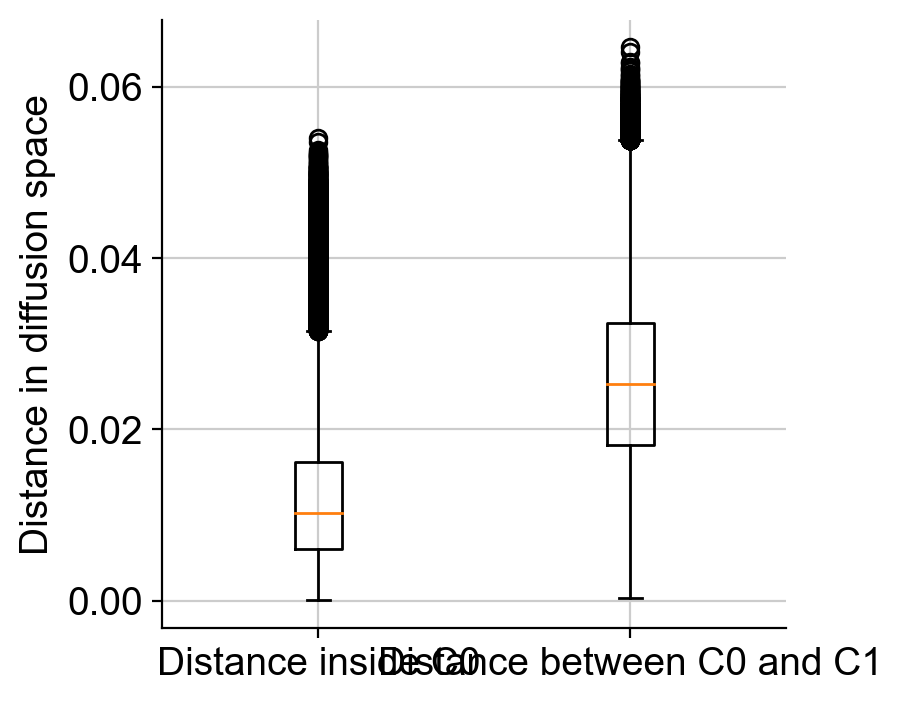

In [97]:
plt.boxplot([within_C0, between_C0_C1]);
plt.xticks([1, 2], ['Distance inside C0', 'Distance between C0 and C1']);
plt.ylabel('Distance in diffusion space')